In [1]:
import matplotlib.pyplot as plt
import numpy as np
from numpy.fft import rfft , rfftfreq
#this is for .wav files
from scipy.io import wavfile
#play the wav file
from IPython.display import Audio 

# Plot function

In [5]:
def plot_function(X,Y,title,x_lable,y_lable,subplot_num1,subplot_num2,subplot_num3):
    plt.subplot(subplot_num1,subplot_num2,subplot_num3)
    plt.plot(X,np.real(Y),'r')
    plt.title(title)
    plt.xlabel(x_lable)
    plt.ylabel(y_lable)
    plt.show()

# Find Max Frequency OF Voise

In this function we find the largest Amplitude value to determine the frequency range and determine the type of speaker gender.

In [4]:
def find_voise_max_frequency(address):
    #reading wav file
    voice_wave_rate , voice_data =  wavfile.read(address)
    signal = voice_data[:,0]
    fourier_transform_of_voice_data = np.abs(rfft(signal))
    power = np.square(fourier_transform_of_voice_data)
    frequency = rfftfreq(signal.size, d=1./voice_wave_rate)
    maximum_power = np.amax(power)
    print("Max Power Of voice: " , maximum_power)
    return maximum_power

# Determining The Gender Of The Speaker

In [3]:
def is_voicse_for_male_or_female(address):
    #reading wav file
    voice_wave_rate , voice_data =  wavfile.read(address)
    signal = voice_data[:,0]
    fourier_transform_of_voice_data = np.abs(rfft(signal))
    power = np.square(fourier_transform_of_voice_data)
    frequency = rfftfreq(signal.size, d=1./voice_wave_rate)
    maximum_power = find_voise_max_frequency(address)
    index_of_maximum_power = np.where(power == maximum_power)[0]
    frequency_of_maximum_power = frequency[index_of_maximum_power]
    if frequency_of_maximum_power > 150 :
        print("This voice belongs to a woman")
    else : print("This voice belongs to a man")

# Wav Read And Ploting Function

In this function, we first read the file and then find the time array and Fourier transforms of the audio signal from a channel and form diagrams of its time domain and power spectrum.

In [2]:
def wav_read_and_ploting_function(address):
    is_voicse_for_male_or_female(address)
    #reading wav file
    voice_wave_rate , voice_data =  wavfile.read(address)
    signal = voice_data[:,0]
    voice_time = np.linspace(0, voice_data.shape[0] / voice_wave_rate, voice_data.shape[0])
    power = np.square(np.abs(rfft(signal)))
    frequency = rfftfreq(signal.size, d=1.0/voice_wave_rate)
    Audio(address)
    plot_function(voice_time ,voice_data,"WAV Signal in time section"
                , "Time(s)" , "Amplitude" , 3,1,1)
    plot_function(frequency[0:30000],power[0:30000],"power spectrum"
               , "frequency" , "power"  , 3,1,3)

# Samples

</br></br></br></br>

# First WAV File

In [6]:
print("First WAV File")
Audio('v0.wav')

First WAV File


Max Power Of voice:  5086416107345642.0
This voice belongs to a woman


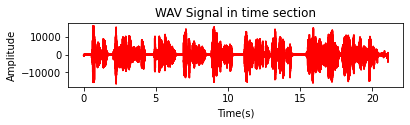

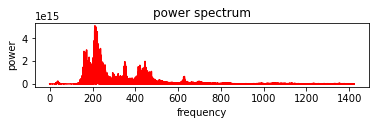

In [9]:
wav_read_and_ploting_function('v0.wav')

# Second WAV File

In [10]:
Audio('v1.wav')

Max Power Of voice:  1434182402279356.2
This voice belongs to a man


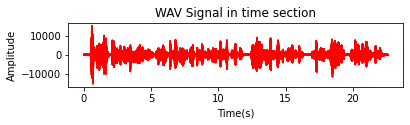

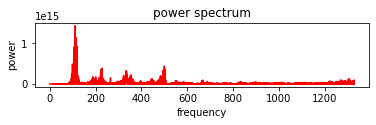

In [11]:
wav_read_and_ploting_function('v1.wav')

# Third WAV File

In [12]:
Audio('v2.wav')

Max Power Of voice:  2273797219422654.5
This voice belongs to a man


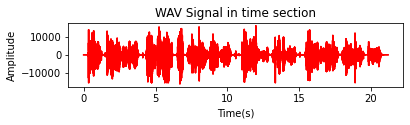

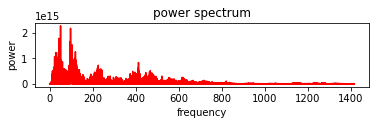

In [13]:
wav_read_and_ploting_function('v2.wav')

# Fourth WAV File

In [14]:
Audio('v4.wav')

Max Power Of voice:  3014172889450401.0
This voice belongs to a woman


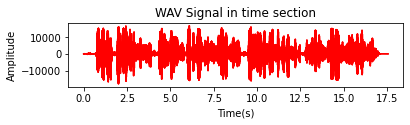

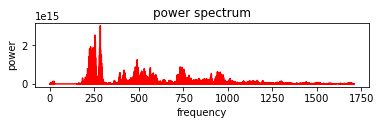

In [16]:
wav_read_and_ploting_function('v4.wav')

Max Power Of voice:  6291806726743698.0
This voice belongs to a woman


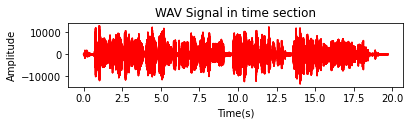

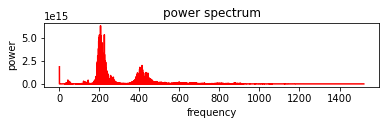

In [124]:
wav_read_and_ploting_function('C:/Users/ABTIN/Desktop/voices/v5.wav')